<a href="https://colab.research.google.com/github/Chiosas/Mushrooms/blob/master/Mushrooms_image_set_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ***Initial Setup***

### ***Environment Setup***

In [0]:
import os
from pathlib import Path

In [0]:
DATA_DIR = Path('data/mushrooms')
MODEL_DIR = Path('model/mushrooms')

In [0]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

FIRST_RUN = not os.path.exists(str(MODEL_DIR))

In [0]:
if not IN_COLAB:
    os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
    os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [0]:
if FIRST_RUN:
    os.makedirs(MODEL_DIR, exist_ok=True)
    os.makedirs(DATA_DIR, exist_ok=True)

if IN_COLAB and FIRST_RUN:
    !pip install -q --upgrade scikit-optimize
    !pip install -q -U --pre efficientnet

### ***Kaggle Setup***

In [0]:
def setup_kaggle():
    x = !ls kaggle.json
    assert x == ['kaggle.json'], 'Upload kaggle.json'
    !mkdir /root/.kaggle
    !mv kaggle.json /root/.kaggle
    !chmod 600 /root/.kaggle/kaggle.json

In [0]:
# Make sure you've uploaded 'kaggle.json' file into Colab
if IN_COLAB and FIRST_RUN:
    setup_kaggle()

In [0]:
import kaggle

In [0]:
if IN_COLAB and FIRST_RUN:
    kaggle.api.authenticate()
    kaggle.api.dataset_download_files(
        dataset='maysee/mushrooms-classification-common-genuss-images',
        path=DATA_DIR,
        unzip=True,
    )

### ***Importing Dependencies***

In [0]:
try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

In [0]:
from imports import *

In [0]:
tf.__version__

'2.0.0-rc2'

In [0]:
if FIRST_RUN:
    exit()

## ***Dataset Description***

### **Content**

![Boletus edulis](https://www.first-nature.com/fungi/images/boletaceae/boletus-edulis1.jpg)


There are images of most common Northern European mushrooms genuses inside of this dataset. Each folder consist of from 300 to 1500 selected images of mushrooms genuses. Labels are the folder's names.

*Format:* JPG images.

*Volume:* Total number of mushrooms' images is more than 6714. From 300 to 1500 selected images of mushrooms genuses per class.

###***Making image dataframes***

In [0]:
folder = 'Mushrooms'
labels = [label for label in list(os.listdir(DATA_DIR/folder)) if label[0].isalpha()]
cols = ['Label', 'Path', 'Image', 'Full_Path', 'Width', 'Height']

In [0]:
def read_dir(label, cols, folder):
    file_list = [name for name in list(os.listdir(DATA_DIR/folder/label.strip())) if name[0].isalnum()]
    image_df = pd.DataFrame(columns=cols)
    image_df['Image'] = file_list
    image_df['Label'] = label
    image_df['Path'] = str(DATA_DIR/folder/label.strip())
    image_df['Full_Path'] = image_df['Path'] + '/' + image_df['Image']
    
    return image_df

In [0]:
def make_image_df(labels, cols, set_path):
    image_df = pd.DataFrame(columns=cols)

    for label in labels:
        image_df = image_df.append(read_dir(label, cols, set_path), ignore_index=True)
    
    for row in range(image_df.shape[0]):
        img_dims = PIL.Image.open(image_df.iloc[row]['Full_Path']).size
        image_df.iloc[row]['Width'] = img_dims[0]
        image_df.iloc[row]['Height'] = img_dims[1]
    
    return image_df

In [0]:
raw_df = make_image_df(labels, cols, set_path='Mushrooms')

In [0]:
# list of files to remove
files_to_exclude = [
    'data/mushrooms/Mushrooms/Russula/092_43B354vYxm8.jpg',
]

In [0]:
for item in files_to_exclude:
    raw_df = raw_df[raw_df['Full_Path'] != item]

In [0]:
raw_df.head()

,Label,Path,Image,Full_Path,Width,Height
0,Hygrocybe,data/mushrooms/Mushrooms/Hygrocybe,090_iI6g6iXuZ_0.jpg,data/mushrooms/Mushrooms/Hygrocybe/090_iI6g6iX...,778,600
1,Hygrocybe,data/mushrooms/Mushrooms/Hygrocybe,042_ReeLvvdcScs.jpg,data/mushrooms/Mushrooms/Hygrocybe/042_ReeLvvd...,800,551
2,Hygrocybe,data/mushrooms/Mushrooms/Hygrocybe,339_E1wF-8RwtU4.jpg,data/mushrooms/Mushrooms/Hygrocybe/339_E1wF-8R...,800,868
3,Hygrocybe,data/mushrooms/Mushrooms/Hygrocybe,171_m9-lUVcXAbs.jpg,data/mushrooms/Mushrooms/Hygrocybe/171_m9-lUVc...,800,533
4,Hygrocybe,data/mushrooms/Mushrooms/Hygrocybe,232_mREfJiLamtw.jpg,data/mushrooms/Mushrooms/Hygrocybe/232_mREfJiL...,800,669


In [0]:
raw_df.tail()

,Label,Path,Image,Full_Path,Width,Height
6709,Lactarius,data/mushrooms/Mushrooms/Lactarius,0747_adx1MMw58MI.jpg,data/mushrooms/Mushrooms/Lactarius/0747_adx1MM...,640,480
6710,Lactarius,data/mushrooms/Mushrooms/Lactarius,0057_vo2wCaUiwF0.jpg,data/mushrooms/Mushrooms/Lactarius/0057_vo2wCa...,800,600
6711,Lactarius,data/mushrooms/Mushrooms/Lactarius,0186_F1BINnkGWL4.jpg,data/mushrooms/Mushrooms/Lactarius/0186_F1BINn...,800,600
6712,Lactarius,data/mushrooms/Mushrooms/Lactarius,0883_X5Cxs1Iee5E.jpg,data/mushrooms/Mushrooms/Lactarius/0883_X5Cxs1...,750,506
6713,Lactarius,data/mushrooms/Mushrooms/Lactarius,0816_VqEE-RTJhgk.jpg,data/mushrooms/Mushrooms/Lactarius/0816_VqEE-R...,800,600


###***Exploring image data***

In [0]:
df_dims = raw_df.shape
print(f'Total number of images in training dataset is {df_dims[0]}.')

n_classes = raw_df['Label'].nunique()
print(f'Total number of classes is {n_classes}.')

Total number of images in training dataset is 6713.
Total number of classes is 9.


In [0]:
class_dist_df = raw_df[['Image', 'Label']].groupby('Label', as_index=False).count()

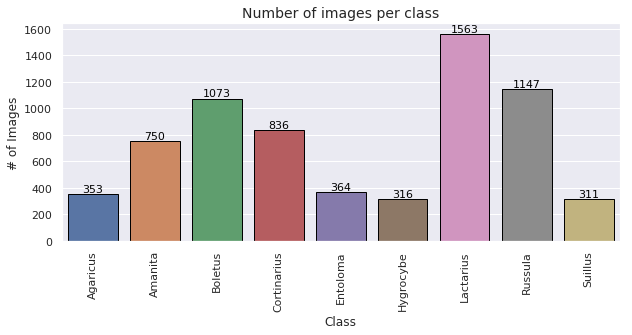

In [0]:
# setting plot style & size
sns.set(style='darkgrid')
plt.figure(figsize=(10, 4))

# rendering plot
sns.barplot(x='Label', y='Image', data=class_dist_df, edgecolor='black')

# adding chart title
plt.title('Number of images per class', size=14)

# adding custom labels for axes
plt.xlabel("Class")
plt.ylabel("# of Images")

# rotating axis labels
plt.xticks(rotation=90)

# adding labels on data points
for index, row in class_dist_df.iterrows():
    plt.text(row.name, row.Image + 15, row.Image, color='black', ha="center", size=11)

In [0]:
image_dims_df = raw_df[['Label', 'Height', 'Width']]

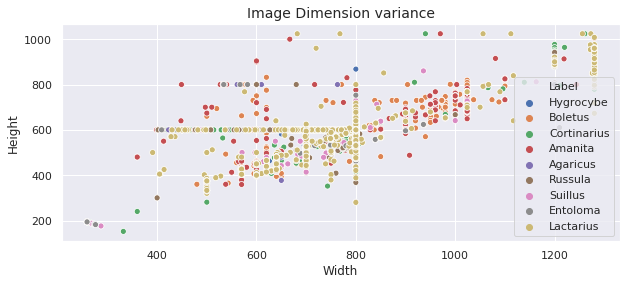

In [0]:
# setting plot style & size
sns.set(style='darkgrid')
plt.figure(figsize=(10, 4))

# adding chart title
plt.title('Image Dimension variance', size=14)

# rendering plot
sns.scatterplot(x='Width', y='Height', hue='Label', data=image_dims_df)

In [0]:
print(f"Image dimensions vary from {raw_df['Height'].min()} to {raw_df['Height'].max()} pixels in height.")
print(f"And from {raw_df['Width'].min()} to {raw_df['Width'].max()} pixels in width.")

Image dimensions vary from 152 to 1024 pixels in height.
And from 259 to 1280 pixels in width.


## ***Data Preparation***

###***Data Split - Train/Validation***

In [0]:
train_df, testval_df = train_test_split(raw_df, test_size=0.4, random_state=10, stratify=raw_df['Label'])

In [0]:
val_df, test_df = train_test_split(testval_df, test_size=0.5, random_state=10, stratify=testval_df['Label'])

In [0]:
sample_df, _ = train_test_split(train_df, test_size=0.4, random_state=10, stratify=train_df['Label'])

In [0]:
train_df.reset_index(drop=True, inplace=True)
val_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)
sample_df.reset_index(drop=True, inplace=True)

In [0]:
# Checking the shapes of splited data
[x.shape for x in (train_df, val_df, test_df, sample_df)]

[(4027, 6), (1343, 6), (1343, 6), (2416, 6)]

In [0]:
file_contents = (train_df, val_df, test_df, sample_df)
file_names = ('train_data.csv', 'val_data.csv', 'test_data.csv', 'sample_data.csv')

In [0]:
# Saving the data to csv files
for name, contents in zip(file_names, file_contents):
    contents.to_csv(path_or_buf=DATA_DIR/name, index=False, header=True)

In [0]:
# Loading the data from csv files
train_df = pd.read_csv(DATA_DIR/'train_data.csv', low_memory=False)
val_df = pd.read_csv(DATA_DIR/'val_data.csv', low_memory=False)
test_df = pd.read_csv(DATA_DIR/'test_data.csv', low_memory=False)
sample_df = pd.read_csv(DATA_DIR/'sample_data.csv', low_memory=False)

In [0]:
train_df.head()

,Label,Path,Image,Full_Path,Width,Height
0,Cortinarius,data/mushrooms/Mushrooms/Cortinarius,748_viu_uu1eo-8.jpg,data/mushrooms/Mushrooms/Cortinarius/748_viu_u...,800,549
1,Amanita,data/mushrooms/Mushrooms/Amanita,061_7NVKydh43k4.jpg,data/mushrooms/Mushrooms/Amanita/061_7NVKydh43...,800,558
2,Lactarius,data/mushrooms/Mushrooms/Lactarius,283_1PVtFB72e3A.jpg,data/mushrooms/Mushrooms/Lactarius/283_1PVtFB7...,800,600
3,Lactarius,data/mushrooms/Mushrooms/Lactarius,1078_MoTnAch13vg.jpg,data/mushrooms/Mushrooms/Lactarius/1078_MoTnAc...,800,533
4,Boletus,data/mushrooms/Mushrooms/Boletus,0919_-lKdBpEex0M.jpg,data/mushrooms/Mushrooms/Boletus/0919_-lKdBpEe...,1009,757


### ***Data Preprocessing***

In [0]:
cat_cols = ['Label']

In [0]:
def cats_fit_transform(df, cat_cols):
    df = df.copy()
    cat_features_map = {}
    df[cat_cols] = df[cat_cols].astype('category')
    for cat_col in cat_cols:
        cat_features_map[cat_col] = dict(enumerate(df[cat_col].cat.categories))
        df[cat_col] = df[cat_col].cat.codes
    return df, cat_features_map

In [0]:
def cats_transform(df, cat_features_map):
    df = df.copy()
    for cat_col in cat_features_map:
        df[cat_col] = df[cat_col].map(
            {value: key for key, value in cat_features_map[cat_col].items()}
        )
        df[cat_col].fillna(value=0, inplace=True)
        df[cat_col] = df[cat_col].astype(int)
    return df

In [0]:
train_df, cat_features_map = cats_fit_transform(train_df, cat_cols)

In [0]:
train_df.head()

,Label,Path,Image,Full_Path,Width,Height
0,3,data/mushrooms/Mushrooms/Cortinarius,748_viu_uu1eo-8.jpg,data/mushrooms/Mushrooms/Cortinarius/748_viu_u...,800,549
1,1,data/mushrooms/Mushrooms/Amanita,061_7NVKydh43k4.jpg,data/mushrooms/Mushrooms/Amanita/061_7NVKydh43...,800,558
2,6,data/mushrooms/Mushrooms/Lactarius,283_1PVtFB72e3A.jpg,data/mushrooms/Mushrooms/Lactarius/283_1PVtFB7...,800,600
3,6,data/mushrooms/Mushrooms/Lactarius,1078_MoTnAch13vg.jpg,data/mushrooms/Mushrooms/Lactarius/1078_MoTnAc...,800,533
4,2,data/mushrooms/Mushrooms/Boletus,0919_-lKdBpEex0M.jpg,data/mushrooms/Mushrooms/Boletus/0919_-lKdBpEe...,1009,757


In [0]:
print(cat_features_map)

{'Label': {0: 'Agaricus', 1: 'Amanita', 2: 'Boletus', 3: 'Cortinarius', 4: 'Entoloma', 5: 'Hygrocybe', 6: 'Lactarius', 7: 'Russula', 8: 'Suillus'}}


In [0]:
# Saving feature mapping for categorical columns into the file
with open(MODEL_DIR/'cat_features_map.pkl', 'wb') as f:
    pickle.dump(cat_features_map, f, pickle.HIGHEST_PROTOCOL)

In [0]:
# Loading feature mapping for categorical columns from the file
with open(MODEL_DIR/'cat_features_map.pkl', 'rb') as f:
    cat_features_map = pickle.load(f)

In [0]:
print(cat_features_map)

{'Label': {0: 'Agaricus', 1: 'Amanita', 2: 'Boletus', 3: 'Cortinarius', 4: 'Entoloma', 5: 'Hygrocybe', 6: 'Lactarius', 7: 'Russula', 8: 'Suillus'}}


In [0]:
classes = list(cat_features_map.get('Label').values())
print(classes)

['Agaricus', 'Amanita', 'Boletus', 'Cortinarius', 'Entoloma', 'Hygrocybe', 'Lactarius', 'Russula', 'Suillus']


In [0]:
val_df = cats_transform(val_df, cat_features_map)

In [0]:
val_df.head()

,Label,Path,Image,Full_Path,Width,Height
0,6,data/mushrooms/Mushrooms/Lactarius,0274_iVpSJF-ZTBM.jpg,data/mushrooms/Mushrooms/Lactarius/0274_iVpSJF...,1024,768
1,1,data/mushrooms/Mushrooms/Amanita,069_szzmCkEtJbo.jpg,data/mushrooms/Mushrooms/Amanita/069_szzmCkEtJ...,800,600
2,3,data/mushrooms/Mushrooms/Cortinarius,730_cMs4aNFhNDU.jpg,data/mushrooms/Mushrooms/Cortinarius/730_cMs4a...,800,540
3,6,data/mushrooms/Mushrooms/Lactarius,1049_zHyhflGhqMI.jpg,data/mushrooms/Mushrooms/Lactarius/1049_zHyhfl...,500,375
4,1,data/mushrooms/Mushrooms/Amanita,270_dpL4oAPe5Jo.jpg,data/mushrooms/Mushrooms/Amanita/270_dpL4oAPe5...,800,536


In [0]:
sample_df = cats_transform(sample_df, cat_features_map)

### ***Image Augementation***

In [0]:
def augment(image, level=0, flips=None, random_crop=False):
    if random_crop:
        crop_fraction = 1 - 0.05 * level
        scaled_dim = tf.to_int32(
            crop_fraction * tf.to_float(tf.reduce_min(tf.shape(image)[:2]))
        )
        image = tf.image.random_crop(image, (scaled_dim, scaled_dim, 3))
        image = tf.image.resize(image, IMG_DIMS)

    if flips in ['horizontal', 'both']:
        image = tf.image.random_flip_left_right(image)
    if flips in ['vertical', 'both']:
        image = tf.image.random_flip_up_down(image)

    if level > 0:
        lower = 1 - 0.1 * level
        upper = 1 + 0.1 * level
        image = tf.image.random_contrast(image, lower=lower, upper=upper)
        image = tf.image.random_saturation(image, lower=lower, upper=upper)
        image = tf.clip_by_value(image, 0.0, 1.0)
    return image

In [0]:
def image_parse(filename, preprocess_fn, img_dims, mode):
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = preprocess_fn(image)
    if mode == 'stretch':
        image = tf.image.resize(image, img_dims)
    elif mode == 'crop':
        image = tf.image.resize_with_crop_or_pad(image, img_dims[0], img_dims[1])
    elif mode == 'crop_stretch':
        image = tf.image.central_crop(image, central_fraction=1)
        image = tf.image.resize(image, img_dims)
    elif mode == 'pad':
        image = tf.image.resize_with_pad(image, img_dims[0], img_dims[1])
    else:
        raise ValueError('mode not implemented')
    return image

In [0]:
def prepare_ds(
    df,
    x,
    y,
    batch_size,
    parse_fn,
    augment_fn,
    mode,
    prefetch=1,
    shuffle=False,
    num_parallel_calls=1,
):
    filenames = np.array([f"{getattr(row, x)}" for row in df.itertuples()])
    labels = df[y].values

    dataset_length = len(filenames)
    preprocess_fn = partial(tf.image.convert_image_dtype, dtype=tf.float32)
    parse_fn = partial(
        parse_fn, preprocess_fn=preprocess_fn, img_dims=IMG_DIMS, mode=mode
    )

    image_ds = (
        tf.data.Dataset.from_tensor_slices(filenames)
        .map(parse_fn, num_parallel_calls=num_parallel_calls)
        .map(augment_fn, num_parallel_calls=num_parallel_calls)
    )
    label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(labels, tf.float32))
    ds = tf.data.Dataset.zip((image_ds, label_ds))

    if shuffle:
        ds = ds.shuffle(dataset_length)

    ds = ds.batch(batch_size)
    ds = ds.repeat()
    if prefetch:
        ds = ds.prefetch(prefetch)
    return ds, dataset_length, batch_size

In [0]:
def plot_dataset(dataset, rows, cols):
    _, ax = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    for i, (x, y) in enumerate(dataset.take(rows * cols)):
        ax[i // cols, i % cols].axis('off')
        ax[i // cols, i % cols].imshow(x[0])
        ax[i // cols, i % cols].set_title(y[0].numpy())

In [0]:
def plot_predictions(images, pred_df, rows=1, cols=6):
    image_ds = [
        img_set for img_set, _ in images[0].take(math.ceil(images[1]/images[2]))
    ]

    positive_df = pred_df[pred_df['Correct Pred.'] == True]
    negative_df = pred_df[pred_df['Correct Pred.'] == False]

    best_correct = positive_df.sort_values(by='Prediction Prob.', ascending=False).iloc[:cols]
    worst_correct = positive_df.sort_values(by='Prediction Prob.').iloc[:cols]
    best_wrong = negative_df.sort_values(by='Prob. Disparity').iloc[:cols]
    worst_wrong = negative_df.sort_values(by='Prob. Disparity', ascending=False).iloc[:cols]

    results = [best_correct, worst_correct, best_wrong, worst_wrong]
    layers = len(results)

    _, ax = plt.subplots(rows * layers, cols, figsize=(3 * cols, 3.25 * rows * layers))
    for i, layer in enumerate(results):
        for j, row in enumerate(layer.itertuples()):
            index_no = row[0]
            label = row[1]
            pred = row[2]
            label_prob = row[3]
            pred_prob = row[4]
 
            batch_idx = index_no // images[2] - 1
            image_idx = index_no % images[2] - 1
            image = image_ds[batch_idx][image_idx]
            line1 = f'Label - {label:d}, Pred. - {pred:d}'
            line2 = f'\n{label_prob * 100:.2f}% vs. {pred_prob * 100:.2f}%'
            img_title = line1 + line2

            idx = (i, j)
            ax[idx].axis('off')
            ax[idx].imshow(image)
            ax[idx].set_title(img_title)

In [0]:
# sample_dataset, sample_dataset_length, sample_batch_size = prepare_ds(
#     df=sample_df,
#     x=image_path_col,
#     y=target_col,
#     batch_size=64,
#     parse_fn=image_parse,
#     augment_fn=augment,
#     mode='pad',
#     shuffle=False,
#     prefetch=1,
#     num_parallel_calls=-1,
# )

## ***Building Model***

### ***Image Classification Model***

In [0]:
def make_cnn_model(
    base_models,
    n_classes,
    input_shape,
    dropout_rate=0.0,
    l1=1e-8,
    l2=1e-8,
    weights='imagenet',
):
    model_input = keras.layers.Input(shape=input_shape)
    
    models = []
    for base_model in base_models:
        branch = base_model(include_top=False, weights=weights)(model_input)
        branch = keras.layers.concatenate([
            keras.layers.GlobalAvgPool2D()(branch),
            keras.layers.GlobalMaxPool2D()(branch),
        ])
        models.append(branch)
    
    if len(models) > 1:
        x = keras.layers.concatenate(models)
    else:
        x = models[0]
    
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Dropout(dropout_rate)(x)
    
    if n_classes > 2:
        activation_func=keras.activations.softmax
    else:
        activation_func=keras.activations.sigmoid
        if n_classes == 2:
            n_classes -= 1
    
    x = keras.layers.Dense(
        n_classes,
        kernel_regularizer=keras.regularizers.l1_l2(l1, l2),
        activation=activation_func,
    )(x)
        
    return keras.Model(inputs=model_input, outputs=x)

In [0]:
def train_cnn_model(
    train,
    validation,
    base_models,
    optimizer,
    n_classes,
    input_shape,
    dropout=0.0,
    l1=3e-6,
    l2=3e-5,
    learn_rate=1e-4,
    epochs=15,
    easing_epochs=5,
    imagenet=True,
):
    checkpoint_path = str(Path(MODEL_DIR/'training.ckpt'))

    train_dataset = train[0]
    train_dataset_length = train[1]
    train_batch_size = train[2]
    val_dataset = validation[0]
    val_dataset_length = validation[1]
    val_batch_size = validation[2]

    if imagenet:
        weights = 'imagenet'
        print('Training Model with Transfer Learning ')
    else:
        weights = None
        print('Training Model without Transfer Learning ')
    
    model = make_cnn_model(
        base_models=base_models,
        n_classes=n_classes,
        input_shape=input_shape,
        dropout_rate=dropout,
        l1=l1,
        l2=l2,
        weights=weights,
    )
    
    if n_classes > 2:
        loss_func=keras.losses.sparse_categorical_crossentropy
        evaluation_metrics=[
            keras.metrics.sparse_categorical_accuracy,
        ]
    else:
        loss_func=keras.losses.binary_crossentropy
        evaluation_metrics=[
            keras.metrics.binary_accuracy,
        ]
    
    if easing_epochs:
        print("Frozen Layers' processing:")
        for layer in model.layers[:-1]:
            layer.trainable = False
        
        model.compile(
            optimizer=optimizer(learn_rate),
            loss=loss_func,
            metrics=evaluation_metrics,
        )

        easing_reduce_lr_patience = max(2, easing_epochs // 3)
        easing_early_stopping_patience = easing_reduce_lr_patience * 2
        
        model.fit(
            x=train_dataset,
            steps_per_epoch=math.ceil(train_dataset_length/train_batch_size),
            validation_data=val_dataset,
            validation_steps=math.ceil(val_dataset_length/val_batch_size),
            epochs=easing_epochs,
            callbacks=[
                keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_best_only=True, save_weights_only=True),
                keras.callbacks.ReduceLROnPlateau(factor=0.3, patience=easing_reduce_lr_patience),
                keras.callbacks.EarlyStopping(patience=easing_early_stopping_patience, restore_best_weights=True),
            ],
            verbose=1,
        )        

        for layer in model.layers[:-1]:
            layer.trainable = True

    print("All Layers' processing:")
    model.compile(
        optimizer=optimizer(learn_rate),
        loss=loss_func,
        metrics=evaluation_metrics,
    )
    
    reduce_lr_patience = max(5, epochs // 10)
    early_stopping_patience = reduce_lr_patience * 2.5
    
    history = model.fit(
        x=train_dataset,
        steps_per_epoch=math.ceil(train_dataset_length/train_batch_size),
        validation_data=val_dataset,
        validation_steps=math.ceil(val_dataset_length/val_batch_size),
        epochs=epochs,
        callbacks=[
            keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_best_only=True, save_weights_only=True),
            keras.callbacks.ReduceLROnPlateau(factor=0.3, patience=reduce_lr_patience, cooldown=5),
            keras.callbacks.EarlyStopping(patience=early_stopping_patience, restore_best_weights=True),
        ],
        verbose=1,
    )

    model.load_weights(checkpoint_path)
    
    return model, history

### ***Utility Functions***

In [0]:
def plot_history(history, contains, skip=0):
    df = pd.DataFrame(history.history)
    df[list(df.filter(regex=contains))].iloc[skip:].plot()

In [0]:
def model_predict(model, dataset, step):
    preds = model.predict(dataset, steps=step)
    labels = np.concatenate([
        y.numpy() for _, y in dataset.take(step)
    ])
    return preds, labels

In [0]:
# Evaluating models
def model_evaluate(model, dataset, n_classes, dataset_length, batch_size):
    
    # Predicting on dataset
    preds, labels = model_predict(
        model,
        dataset,
        step=math.ceil(dataset_length/batch_size),
    )

    if n_classes > 2:
        preds = preds.argmax(axis=1)
    else:
        preds = preds > 0.5

    # Evaluating model
    model_prec = precision_score(labels, preds, average='weighted')
    model_accu = accuracy_score(labels, preds)
    model_f1 = f1_score(labels, preds, average='weighted')
    
    return model_prec, model_accu, model_f1

In [0]:
def save_nn_model(model, architecture_path, weights_path):
    model.save_weights(weights_path)
    with open(architecture_path, "w") as f:
        f.write(model.to_json())

In [0]:
def load_nn_model(architecture_path, weights_path):
    with open(architecture_path, "r") as f:
        model = keras.models.model_from_json(f.read())
    model.load_weights(weights_path)
    return model

## ***Exploring Different Model Architectures***

In [0]:
target_col = 'Label'
image_path_col = 'Full_Path'
IMG_DIMS = (99, 99)

In [0]:
n_classes = train_df[target_col].nunique()

In [0]:
n_classes

9

In [0]:
train_dataset, train_dataset_length, train_batch_size = prepare_ds(
    df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=2, flips='both'),
    mode='crop_stretch',
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,
)

In [0]:
val_dataset, val_dataset_length, val_batch_size = prepare_ds(
    df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=augment,
    mode='crop_stretch',
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,
)

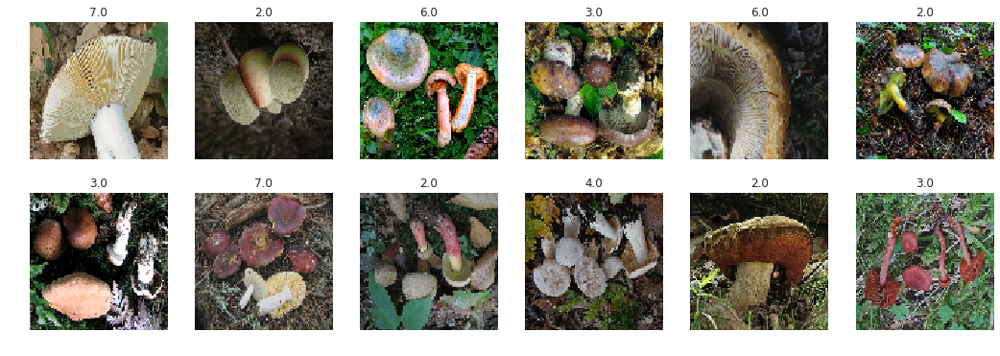

In [0]:
plot_dataset(train_dataset, 2, 6)

In [0]:
# Preparing to capture models & metrics
arch_model_metrics = pd.DataFrame(columns=['Train Time', 'Eval Time', 'Loss', 'Precision', 'Accuracy', 'F1 score'])
base_model_list = [
#    (keras.applications.ResNet50V2, 'ResNet50V2'),
#    (keras.applications.DenseNet121, 'DenseNet121'),
    (keras.applications.MobileNetV2, 'MobileNetV2'),
    (keras.applications.InceptionV3, 'InceptionV3'),
#    (keras.applications.ResNet101V2, 'ResNet101V2'),
    (keras.applications.DenseNet169, 'DenseNet169'),
    (keras.applications.Xception, 'Xception'),
    (keras.applications.ResNet152V2, 'ResNet152V2'),
#    (keras.applications.DenseNet201, 'DenseNet201'),
#    (keras.applications.InceptionResNetV2, 'InceptionResNetV2'),
#     keras.applications.NASNetMobile,
#    (efn.EfficientNetB0, 'EfficientNetB0'),
    (efn.EfficientNetB1, 'EfficientNetB1'),
    (efn.EfficientNetB2, 'EfficientNetB2'),
    (efn.EfficientNetB3, 'EfficientNetB3'),
#    (efn.EfficientNetB4, 'EfficientNetB4'),
#    (efn.EfficientNetB5, 'EfficientNetB5'),
#    (efn.EfficientNetB6, 'EfficientNetB6'),
]

In [0]:
for base_model, model_name in base_model_list:
    
    print("\nBase Model Architecture -", model_name)
    start_time = time.time()
    cnn_base_model, cnn_base_history = train_cnn_model(
        train = [
            train_dataset,
            train_dataset_length,
            train_batch_size,
        ],
        validation = [
            val_dataset,
            val_dataset_length,
            val_batch_size,
        ],
        base_models = [
            base_model,
        ],
        optimizer=keras.optimizers.Adam,
        n_classes=n_classes,
        input_shape=IMG_DIMS + (3,),
        dropout=0.4,
        l1=1e-4,
        l2=1e-5,
        learn_rate=3e-4,
        epochs=90,
        easing_epochs=10,
    )
    end_time = time.time()

    print("------------".center(80, "-"))

    eval_start_time = time.time()
    loss, accuracy = cnn_base_model.evaluate(val_dataset, steps=math.ceil(val_dataset_length/val_batch_size))
    eval_end_time = time.time()
    
    print("------------".center(80, "-"))
    print(
        "Name: {} Train Time: {:.1f} min. Eval Time: {:.2f}s Loss: {:.4f} Accuracy: {:.2%}".format(
            model_name,
            (end_time - start_time) / 60,
            (eval_end_time - eval_start_time),
            loss,
            accuracy,
        )
    )
    print("------------".center(80, "-"))
    
    model_prec, model_accu, model_f1 = model_evaluate(cnn_base_model, val_dataset, n_classes, val_dataset_length, val_batch_size)
    arch_model_metrics.loc[model_name, 'Train Time'] = (end_time - start_time) / 60
    arch_model_metrics.loc[model_name, 'Eval Time'] = (eval_end_time - eval_start_time)
    arch_model_metrics.loc[model_name, 'Loss'] = loss
    arch_model_metrics.loc[model_name, 'Precision'] = model_prec
    arch_model_metrics.loc[model_name, 'Accuracy'] = model_accu
    arch_model_metrics.loc[model_name, 'F1 score'] = model_f1

    architecture_path = str(Path(MODEL_DIR/f'{model_name}_weights.h5'))
    weights_path = str(Path(MODEL_DIR/f'{model_name}_arch.json'))
    save_nn_model(cnn_base_model, architecture_path, weights_path)

    del cnn_base_model


Base Model Architecture - MobileNetV2
Training Model with Transfer Learning 


/tensorflow-2.0.0-rc2/python3.6/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


9412608/9406464 [==============================] - 1s 0us/step
Frozen Layers' processing:
Train for 63 steps, validate for 21 steps
Epoch 1/10
63/63 [==============================] - 55s 868ms/step - loss: 4.1153 - sparse_categorical_accuracy: 0.1795 - val_loss: 4.1200 - val_sparse_categorical_accuracy: 0.2137
Epoch 2/10
63/63 [==============================] - 33s 527ms/step - loss: 3.3958 - sparse_categorical_accuracy: 0.2344 - val_loss: 3.9443 - val_sparse_categorical_accuracy: 0.2435
Epoch 3/10
63/63 [==============================] - 34s 536ms/step - loss: 3.0432 - sparse_categorical_accuracy: 0.2704 - val_loss: 3.9537 - val_sparse_categorical_accuracy: 0.2621
Epoch 4/10
63/63 [==============================] - 33s 523ms/step - loss: 2.8025 - sparse_categorical_accuracy: 0.3119 - val_loss: 3.4499 - val_sparse_categorical_accuracy: 0.3075
Epoch 5/10
63/63 [==============================] - 35s 562ms/step - loss: 2.6801 - sparse_categorical_accuracy: 0.3253 - val_loss: 3.6000 - val

In [0]:
arch_model_metrics.sort_values(by='F1 score', ascending=False)

,Train Time,Eval Time,Loss,Precision,Accuracy,F1 score
DenseNet169,53.064,8.99594,0.984965,0.757429,0.758749,0.757129
EfficientNetB3,40.5133,9.0508,1.20164,0.670148,0.674609,0.670113
EfficientNetB2,37.1194,8.9305,1.14472,0.664866,0.670886,0.66507
MobileNetV2,68.6046,8.57798,1.79833,0.663271,0.664929,0.663276
EfficientNetB1,35.686,9.15809,1.15318,0.66186,0.664185,0.660685
ResNet152V2,80.0614,9.87109,1.25819,0.652385,0.648548,0.646952
Xception,34.866,8.87462,1.50424,0.609075,0.594937,0.57857
InceptionV3,42.1023,8.76487,1.40077,0.597297,0.583023,0.577167


In [0]:
print('Best performers by different metrics:\n')
for col in ['Train Time', 'Eval Time', 'Loss']:
    print(f'{col} of {arch_model_metrics[col].min():.4f} with {arch_model_metrics[col].astype(float).idxmin()} architecture.')

for col in ['Precision', 'Accuracy', 'F1 score']:
    print(f'{col} of {arch_model_metrics[col].max():.2%} with {arch_model_metrics[col].astype(float).idxmax()} architecture.')

Best performers by different metrics:

Train Time of 34.8660 with Xception architecture.
Eval Time of 8.5780 with MobileNetV2 architecture.
Loss of 0.9850 with DenseNet169 architecture.
Precision of 75.74% with DenseNet169 architecture.
Accuracy of 75.87% with DenseNet169 architecture.
F1 score of 75.71% with DenseNet169 architecture.


In [0]:
print('Worst performers by different metrics:\n')
for col in ['Train Time', 'Eval Time', 'Loss']:
    print(f'{col} of {arch_model_metrics[col].max():.4f} with {arch_model_metrics[col].astype(float).idxmax()} architecture.')

for col in ['Precision', 'Accuracy', 'F1 score']:
    print(f'{col} of {arch_model_metrics[col].min():.2%} with {arch_model_metrics[col].astype(float).idxmin()} architecture.')

Worst performers by different metrics:

Train Time of 80.0614 with ResNet152V2 architecture.
Eval Time of 9.8711 with ResNet152V2 architecture.
Loss of 1.7983 with MobileNetV2 architecture.
Precision of 59.73% with InceptionV3 architecture.
Accuracy of 58.30% with InceptionV3 architecture.
F1 score of 57.72% with InceptionV3 architecture.


## ***Training Models***

In [0]:
target_col = 'Label'
image_path_col = 'Full_Path'
IMG_DIMS = (224, 224)

In [0]:
n_classes = train_df[target_col].nunique()

In [0]:
n_classes

9

In [0]:
# Preparing to capture models & metrics
model_metrics = pd.DataFrame(columns=['Precision', 'Accuracy', 'F1 score'])

### ***Training TL (DenseNet169) Model with Frozen Layers***
(padded image dataset)

In [0]:
train_dataset, train_dataset_length, train_batch_size = prepare_ds(
    df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=2, flips='both'),
    mode='pad',
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,
)

In [0]:
val_dataset, val_dataset_length, val_batch_size = prepare_ds(
    df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=augment,
    mode='pad',
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,
)

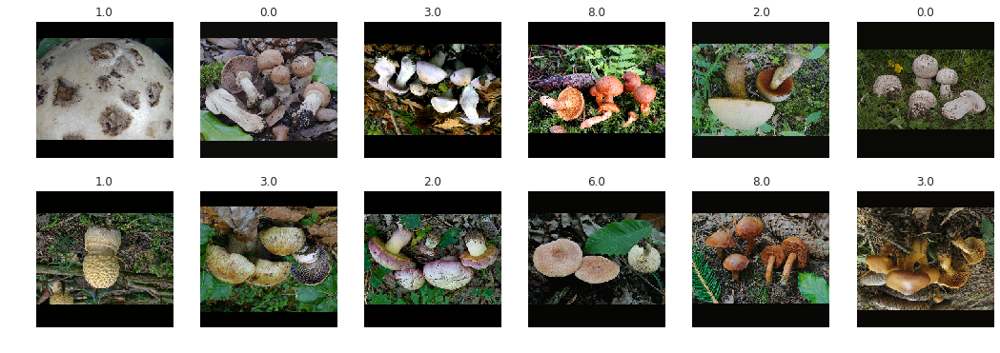

In [0]:
plot_dataset(train_dataset, 2, 6)

In [0]:
cnn_tuned_model, cnn_tuned_history = train_cnn_model(
    train = [
        train_dataset,
        train_dataset_length,
        train_batch_size,
    ],
    validation = [
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    base_models = [
        keras.applications.DenseNet169,
    ],
    optimizer=keras.optimizers.Adam,
    n_classes=n_classes,
    input_shape=IMG_DIMS + (3,),
    dropout=0.4,
    l1=1e-4,
    l2=1e-5,
    learn_rate=3e-4,
    epochs=90,
    easing_epochs=10,
)

Training Model with Transfer Learning 
51879936/51877672 [==============================] - 1s 0us/step
Frozen Layers' processing:
Train for 63 steps, validate for 21 steps
Epoch 1/10
63/63 [==============================] - 128s 2s/step - loss: 4.4001 - sparse_categorical_accuracy: 0.1666 - val_loss: 2.8298 - val_sparse_categorical_accuracy: 0.3001
Epoch 2/10
63/63 [==============================] - 75s 1s/step - loss: 3.2483 - sparse_categorical_accuracy: 0.2709 - val_loss: 2.4177 - val_sparse_categorical_accuracy: 0.3805
Epoch 3/10
63/63 [==============================] - 78s 1s/step - loss: 2.7030 - sparse_categorical_accuracy: 0.3417 - val_loss: 2.0040 - val_sparse_categorical_accuracy: 0.4572
Epoch 4/10
63/63 [==============================] - 82s 1s/step - loss: 2.3227 - sparse_categorical_accuracy: 0.4048 - val_loss: 1.8144 - val_sparse_categorical_accuracy: 0.4974
Epoch 5/10
63/63 [==============================] - 81s 1s/step - loss: 2.1048 - sparse_categorical_accuracy: 0.43

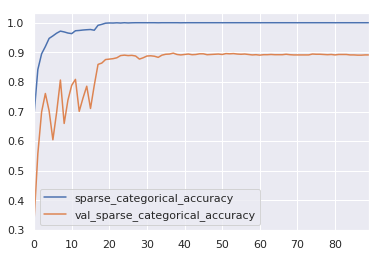

In [0]:
plot_history(cnn_tuned_history, 'accuracy')

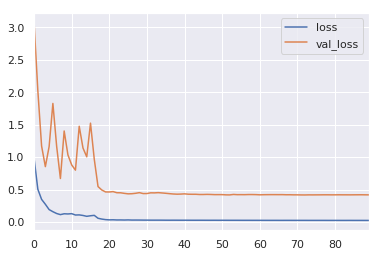

In [0]:
plot_history(cnn_tuned_history, 'loss')

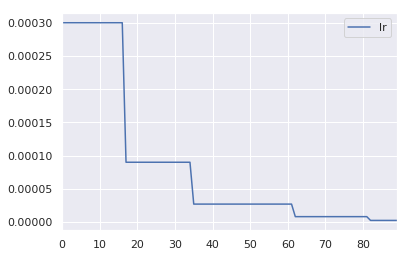

In [0]:
plot_history(cnn_tuned_history, 'lr')

In [0]:
val_predictions, val_labels = model_predict(
    cnn_tuned_model,
    val_dataset,
    step=math.ceil(val_dataset_length/val_batch_size),
)

Precision score: 89.11%
Accuracy score: 89.13%
F1 score: 89.06%

Classification Report:
              precision    recall  f1-score   support

         0.0       0.88      0.83      0.86        71
         1.0       0.91      0.93      0.92       150
         2.0       0.93      0.97      0.95       214
         3.0       0.92      0.85      0.88       168
         4.0       0.80      0.88      0.84        73
         5.0       0.93      0.90      0.92        63
         6.0       0.89      0.91      0.90       312
         7.0       0.87      0.87      0.87       230
         8.0       0.79      0.68      0.73        62

    accuracy                           0.89      1343
   macro avg       0.88      0.87      0.87      1343
weighted avg       0.89      0.89      0.89      1343



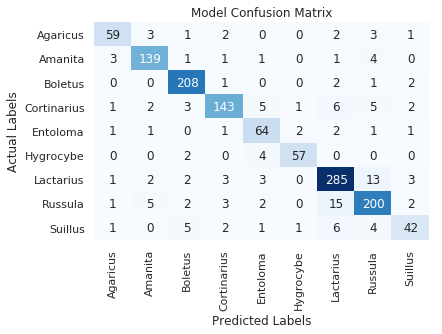

In [0]:
model_report(val_labels, val_predictions, n_classes, classes, all_metrics=True)

In [0]:
model_name = 'TL (DenseNet169) with FL - DS padded'
model_prec, model_accu, model_f1 = model_evaluate(cnn_tuned_model, val_dataset, n_classes, val_dataset_length, val_batch_size)
model_metrics.loc[model_name, 'Precision'] = model_prec
model_metrics.loc[model_name, 'Accuracy'] = model_accu
model_metrics.loc[model_name, 'F1 score'] = model_f1

In [0]:
model_name = 'DenseNet169_DS_pad'
architecture_path = str(Path(MODEL_DIR/f'{model_name}_weights.h5'))
weights_path = str(Path(MODEL_DIR/f'{model_name}_arch.json'))

In [0]:
save_nn_model(cnn_tuned_model, architecture_path, weights_path)

In [0]:
loaded_model = load_nn_model(architecture_path, weights_path)

In [0]:
model_predictions = pd.DataFrame(columns=['Labels', 'Predictions', 'Label Prob.', 'Prediction Prob.'])

In [0]:
model_predictions['Labels'] = val_labels.astype(int)
model_predictions['Predictions'] = val_predictions.argmax(axis=1)
model_predictions['Correct Pred.'] = model_predictions['Labels'] == model_predictions['Predictions']
model_predictions['Label Prob.'] = val_predictions[:, val_labels.astype(int)][np.eye(len(val_labels.astype(int)), dtype=bool)]
model_predictions['Prediction Prob.'] = val_predictions.max(axis=1)
model_predictions['Prob. Disparity'] = model_predictions['Prediction Prob.'] - model_predictions['Label Prob.']
# model_predictions['Image ID'] = model_predictions.index

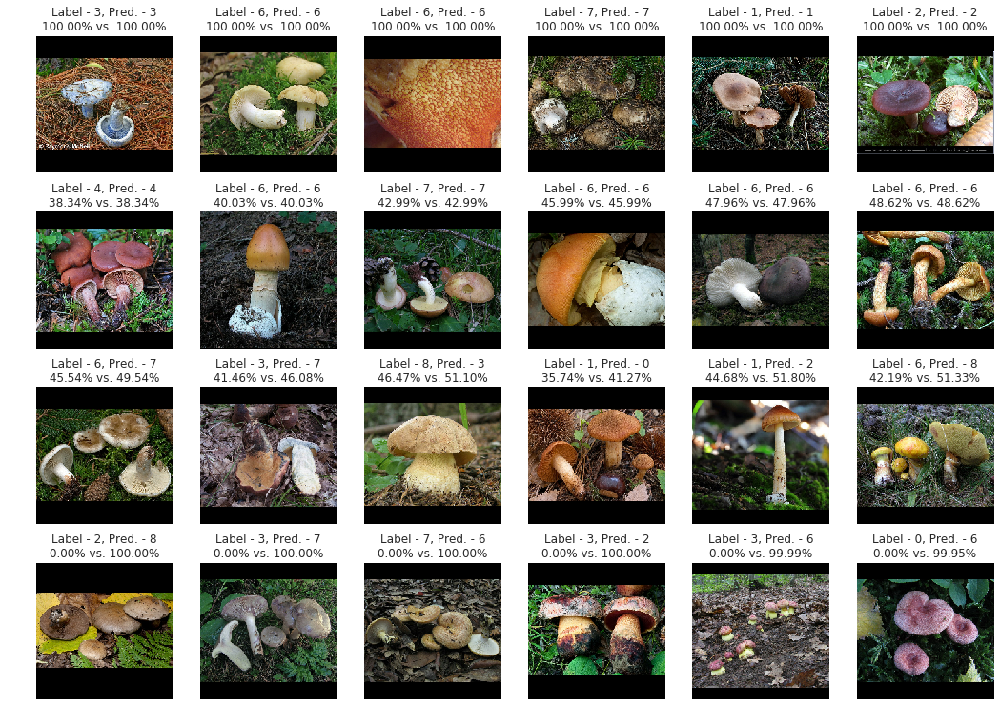

In [0]:
plot_predictions(
    images=[
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    pred_df=model_predictions,
)

In [0]:
del cnn_tuned_model

### ***Training TL (DenseNet169) Model with Frozen Layers***
(stretched image dataset)

In [0]:
train_dataset, train_dataset_length, train_batch_size = prepare_ds(
    df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=2, flips='both'),
    mode='stretch',
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,
)

In [0]:
val_dataset, val_dataset_length, val_batch_size = prepare_ds(
    df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=augment,
    mode='stretch',
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,
)

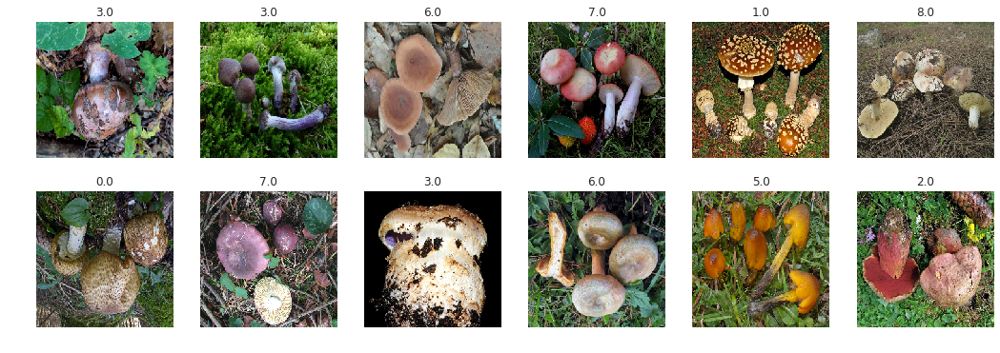

In [0]:
plot_dataset(train_dataset, 2, 6)

In [0]:
cnn_tuned_model, cnn_tuned_history = train_cnn_model(
    train = [
        train_dataset,
        train_dataset_length,
        train_batch_size,
    ],
    validation = [
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    base_models = [
        keras.applications.DenseNet169,
    ],
    optimizer=keras.optimizers.Adam,
    n_classes=n_classes,
    input_shape=IMG_DIMS + (3,),
    dropout=0.4,
    l1=1e-4,
    l2=1e-5,
    learn_rate=3e-4,
    epochs=90,
    easing_epochs=10,
)

Training Model with Transfer Learning 
Frozen Layers' processing:
Train for 63 steps, validate for 21 steps
Epoch 1/10
63/63 [==============================] - 113s 2s/step - loss: 4.1189 - sparse_categorical_accuracy: 0.1957 - val_loss: 2.1888 - val_sparse_categorical_accuracy: 0.3328
Epoch 2/10
63/63 [==============================] - 75s 1s/step - loss: 3.1637 - sparse_categorical_accuracy: 0.2814 - val_loss: 2.0305 - val_sparse_categorical_accuracy: 0.4170
Epoch 3/10
63/63 [==============================] - 80s 1s/step - loss: 2.5888 - sparse_categorical_accuracy: 0.3710 - val_loss: 1.8024 - val_sparse_categorical_accuracy: 0.4520
Epoch 4/10
63/63 [==============================] - 76s 1s/step - loss: 2.3186 - sparse_categorical_accuracy: 0.4105 - val_loss: 1.6919 - val_sparse_categorical_accuracy: 0.4855
Epoch 5/10
63/63 [==============================] - 82s 1s/step - loss: 2.0314 - sparse_categorical_accuracy: 0.4450 - val_loss: 1.5849 - val_sparse_categorical_accuracy: 0.5078
E

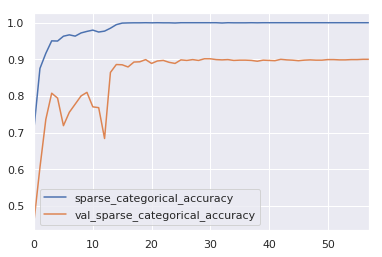

In [0]:
plot_history(cnn_tuned_history, 'accuracy')

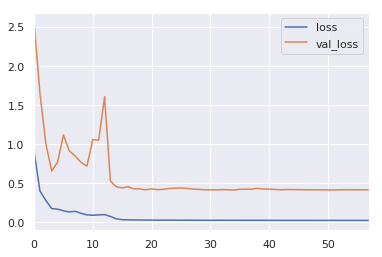

In [0]:
plot_history(cnn_tuned_history, 'loss')

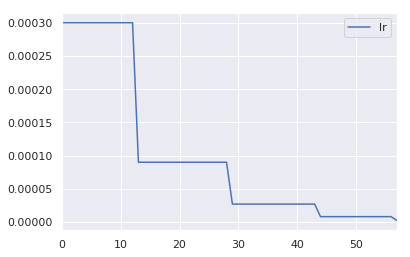

In [0]:
plot_history(cnn_tuned_history, 'lr')

In [0]:
val_predictions, val_labels = model_predict(
    cnn_tuned_model,
    val_dataset,
    step=math.ceil(val_dataset_length/val_batch_size),
)

Precision score: 89.81%
Accuracy score: 89.72%
F1 score: 89.72%

Classification Report:
              precision    recall  f1-score   support

         0.0       0.88      0.80      0.84        71
         1.0       0.92      0.93      0.92       150
         2.0       0.93      0.96      0.94       214
         3.0       0.94      0.87      0.90       168
         4.0       0.84      0.85      0.84        73
         5.0       0.95      0.95      0.95        63
         6.0       0.89      0.91      0.90       312
         7.0       0.88      0.87      0.88       230
         8.0       0.75      0.82      0.78        62

    accuracy                           0.90      1343
   macro avg       0.89      0.89      0.89      1343
weighted avg       0.90      0.90      0.90      1343



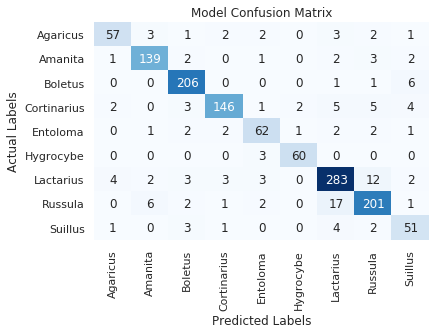

In [0]:
model_report(val_labels, val_predictions, n_classes, classes, all_metrics=True)

In [0]:
model_name = 'TL (DenseNet169) with FL - DS stretched'
model_prec, model_accu, model_f1 = model_evaluate(cnn_tuned_model, val_dataset, n_classes, val_dataset_length, val_batch_size)
model_metrics.loc[model_name, 'Precision'] = model_prec
model_metrics.loc[model_name, 'Accuracy'] = model_accu
model_metrics.loc[model_name, 'F1 score'] = model_f1

In [0]:
model_name = 'DenseNet169_DS_stretch'
architecture_path = str(Path(MODEL_DIR/f'{model_name}_weights.h5'))
weights_path = str(Path(MODEL_DIR/f'{model_name}_arch.json'))

In [0]:
save_nn_model(cnn_tuned_model, architecture_path, weights_path)

In [0]:
loaded_model = load_nn_model(architecture_path, weights_path)

In [0]:
model_predictions = pd.DataFrame(columns=['Labels', 'Predictions', 'Label Prob.', 'Prediction Prob.'])

In [0]:
model_predictions['Labels'] = val_labels.astype(int)
model_predictions['Predictions'] = val_predictions.argmax(axis=1)
model_predictions['Correct Pred.'] = model_predictions['Labels'] == model_predictions['Predictions']
model_predictions['Label Prob.'] = val_predictions[:, val_labels.astype(int)][np.eye(len(val_labels.astype(int)), dtype=bool)]
model_predictions['Prediction Prob.'] = val_predictions.max(axis=1)
model_predictions['Prob. Disparity'] = model_predictions['Prediction Prob.'] - model_predictions['Label Prob.']
# model_predictions['Image ID'] = model_predictions.index

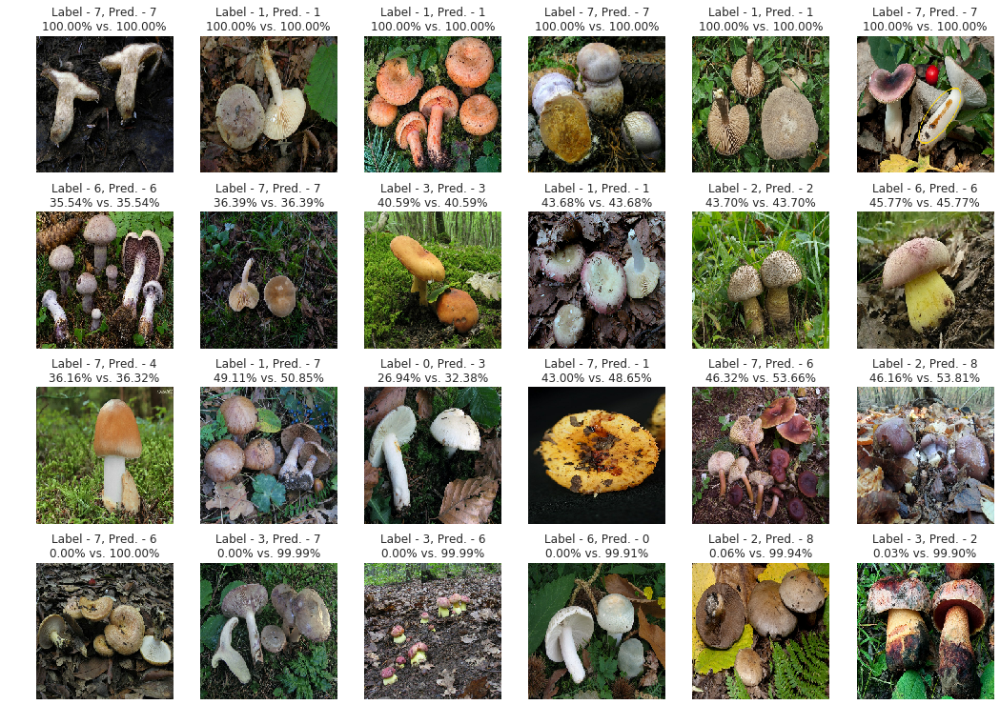

In [0]:
plot_predictions(
    images=[
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    pred_df=model_predictions,
)

In [0]:
del cnn_tuned_model

### ***Training TL (DenseNet169) Model with Frozen Layers***
(centrally cropped & streched image dataset)

In [0]:
train_dataset, train_dataset_length, train_batch_size = prepare_ds(
    df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=2, flips='both'),
    mode='crop_stretch',
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,
)

In [0]:
val_dataset, val_dataset_length, val_batch_size = prepare_ds(
    df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=augment,
    mode='crop_stretch',
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,
)

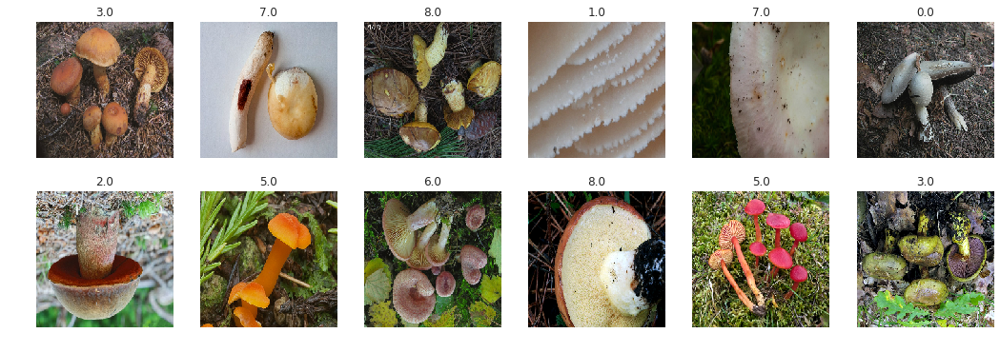

In [0]:
plot_dataset(train_dataset, 2, 6)

In [0]:
cnn_tuned_model, cnn_tuned_history = train_cnn_model(
    train = [
        train_dataset,
        train_dataset_length,
        train_batch_size,
    ],
    validation = [
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    base_models = [
        keras.applications.DenseNet169,
    ],
    optimizer=keras.optimizers.Adam,
    n_classes=n_classes,
    input_shape=IMG_DIMS + (3,),
    dropout=0.4,
    l1=1e-4,
    l2=1e-5,
    learn_rate=3e-4,
    epochs=90,
    easing_epochs=10,
)

Training Model with Transfer Learning 
Frozen Layers' processing:
Train for 63 steps, validate for 21 steps
Epoch 1/10
63/63 [==============================] - 111s 2s/step - loss: 4.1757 - sparse_categorical_accuracy: 0.1934 - val_loss: 2.3570 - val_sparse_categorical_accuracy: 0.3388
Epoch 2/10
63/63 [==============================] - 76s 1s/step - loss: 3.2173 - sparse_categorical_accuracy: 0.2851 - val_loss: 1.8797 - val_sparse_categorical_accuracy: 0.4490
Epoch 3/10
63/63 [==============================] - 81s 1s/step - loss: 2.6567 - sparse_categorical_accuracy: 0.3472 - val_loss: 1.7024 - val_sparse_categorical_accuracy: 0.4944
Epoch 4/10
63/63 [==============================] - 74s 1s/step - loss: 2.3063 - sparse_categorical_accuracy: 0.4090 - val_loss: 1.5392 - val_sparse_categorical_accuracy: 0.5190
Epoch 5/10
63/63 [==============================] - 78s 1s/step - loss: 2.1079 - sparse_categorical_accuracy: 0.4348 - val_loss: 1.5779 - val_sparse_categorical_accuracy: 0.5212
E

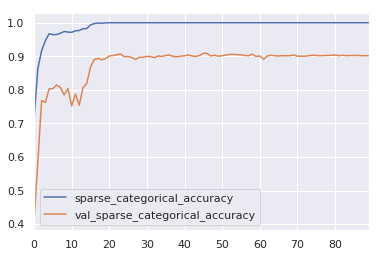

In [0]:
plot_history(cnn_tuned_history, 'accuracy')

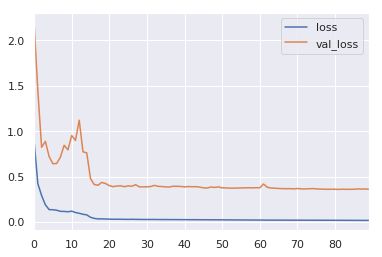

In [0]:
plot_history(cnn_tuned_history, 'loss')

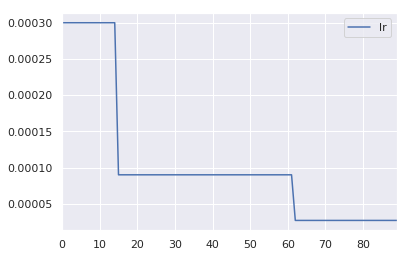

In [0]:
plot_history(cnn_tuned_history, 'lr')

In [0]:
val_predictions, val_labels = model_predict(
    cnn_tuned_model,
    val_dataset,
    step=math.ceil(val_dataset_length/val_batch_size),
)

Precision score: 90.18%
Accuracy score: 90.17%
F1 score: 90.12%

Classification Report:
              precision    recall  f1-score   support

         0.0       0.85      0.82      0.83        71
         1.0       0.91      0.90      0.90       150
         2.0       0.95      0.98      0.97       214
         3.0       0.93      0.85      0.89       168
         4.0       0.90      0.84      0.87        73
         5.0       0.95      0.97      0.96        63
         6.0       0.89      0.94      0.91       312
         7.0       0.86      0.88      0.87       230
         8.0       0.83      0.81      0.82        62

    accuracy                           0.90      1343
   macro avg       0.90      0.89      0.89      1343
weighted avg       0.90      0.90      0.90      1343



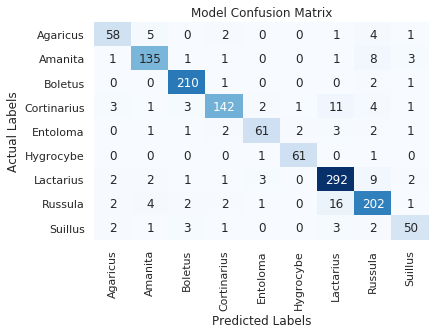

In [0]:
model_report(val_labels, val_predictions, n_classes, classes, all_metrics=True)

In [0]:
model_name = 'TL (DenseNet169) with FL - DS cropped & stretched'
model_prec, model_accu, model_f1 = model_evaluate(cnn_tuned_model, val_dataset, n_classes, val_dataset_length, val_batch_size)
model_metrics.loc[model_name, 'Precision'] = model_prec
model_metrics.loc[model_name, 'Accuracy'] = model_accu
model_metrics.loc[model_name, 'F1 score'] = model_f1

In [0]:
model_name = 'DenseNet169_DS_crop-stretch'
architecture_path = str(Path(MODEL_DIR/f'{model_name}_weights.h5'))
weights_path = str(Path(MODEL_DIR/f'{model_name}_arch.json'))

In [0]:
save_nn_model(cnn_tuned_model, architecture_path, weights_path)

In [0]:
loaded_model = load_nn_model(architecture_path, weights_path)

In [0]:
model_predictions = pd.DataFrame(columns=['Labels', 'Predictions', 'Label Prob.', 'Prediction Prob.'])

In [0]:
model_predictions['Labels'] = val_labels.astype(int)
model_predictions['Predictions'] = val_predictions.argmax(axis=1)
model_predictions['Correct Pred.'] = model_predictions['Labels'] == model_predictions['Predictions']
model_predictions['Label Prob.'] = val_predictions[:, val_labels.astype(int)][np.eye(len(val_labels.astype(int)), dtype=bool)]
model_predictions['Prediction Prob.'] = val_predictions.max(axis=1)
model_predictions['Prob. Disparity'] = model_predictions['Prediction Prob.'] - model_predictions['Label Prob.']
# model_predictions['Image ID'] = model_predictions.index

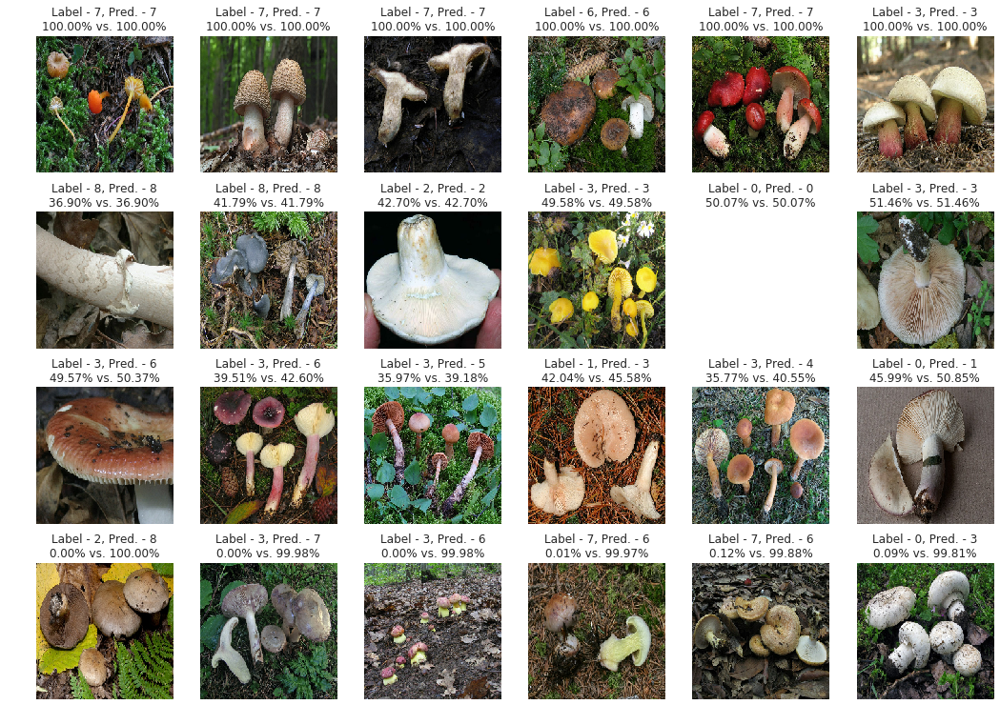

In [0]:
plot_predictions(
    images=[
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    pred_df=model_predictions,
)

In [0]:
del cnn_tuned_model

In [0]:
model_name = 'TL (DenseNet169) with FL - DS cropped & stretched'
model_metrics.loc[model_name, 'Precision'] = 0.901796
model_metrics.loc[model_name, 'Accuracy'] = 0.901713
model_metrics.loc[model_name, 'F1 score'] = 0.901214

In [0]:
model_metrics.sort_values(by='F1 score', ascending=False)

,Precision,Accuracy,F1 score
TL (DenseNet169) with FL - DS cropped & stretched,0.901796,0.901713,0.901214
TL (DenseNet169) with FL - DS stretched,0.898082,0.897245,0.897246
TL (DenseNet169) with FL - DS padded,0.891057,0.891288,0.890558


### ***Training TL (Xception) Model with Frozen Layers***
(centrally cropped & streched 299x299 image dataset)

In [0]:
target_col = 'Label'
image_path_col = 'Full_Path'
IMG_DIMS = (299, 299)

In [0]:
train_dataset, train_dataset_length, train_batch_size = prepare_ds(
    df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=2, flips='both'),
    mode='crop_stretch',
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,
)

In [0]:
val_dataset, val_dataset_length, val_batch_size = prepare_ds(
    df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=64,
    parse_fn=image_parse,
    augment_fn=augment,
    mode='crop_stretch',
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,
)

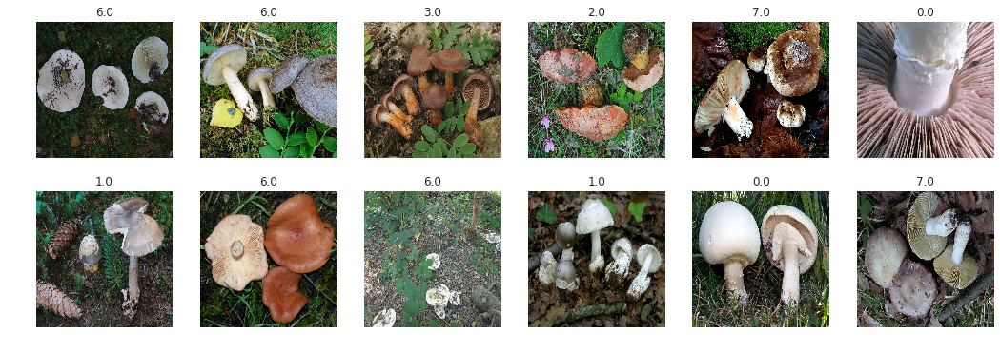

In [0]:
plot_dataset(train_dataset, 2, 6)

In [0]:
cnn_tuned_model, cnn_tuned_history = train_cnn_model(
    train = [
        train_dataset,
        train_dataset_length,
        train_batch_size,
    ],
    validation = [
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    base_models = [
        keras.applications.Xception,
    ],
    optimizer=keras.optimizers.Adam,
    n_classes=n_classes,
    input_shape=IMG_DIMS + (3,),
    dropout=0.4,
    l1=1e-4,
    l2=1e-5,
    learn_rate=3e-4,
    epochs=90,
    easing_epochs=10,
)

Training Model with Transfer Learning 
83689472/83683744 [==============================] - 1s 0us/step
Frozen Layers' processing:
Train for 63 steps, validate for 21 steps
Epoch 1/10
63/63 [==============================] - 160s 3s/step - loss: 2.6262 - sparse_categorical_accuracy: 0.2511 - val_loss: 1.7127 - val_sparse_categorical_accuracy: 0.3999
Epoch 2/10
63/63 [==============================] - 122s 2s/step - loss: 1.9785 - sparse_categorical_accuracy: 0.3827 - val_loss: 1.5272 - val_sparse_categorical_accuracy: 0.4594
Epoch 3/10
63/63 [==============================] - 125s 2s/step - loss: 1.7736 - sparse_categorical_accuracy: 0.4428 - val_loss: 1.4948 - val_sparse_categorical_accuracy: 0.4743
Epoch 4/10
63/63 [==============================] - 126s 2s/step - loss: 1.5884 - sparse_categorical_accuracy: 0.4959 - val_loss: 1.3908 - val_sparse_categorical_accuracy: 0.5011
Epoch 5/10
63/63 [==============================] - 129s 2s/step - loss: 1.4935 - sparse_categorical_accuracy: 

ResourceExhaustedError: ignored

In [0]:
plot_history(cnn_tuned_history, 'accuracy')

In [0]:
plot_history(cnn_tuned_history, 'loss')

In [0]:
plot_history(cnn_tuned_history, 'lr')

In [0]:
val_predictions, val_labels = model_predict(
    cnn_tuned_model,
    val_dataset,
    step=math.ceil(val_dataset_length/val_batch_size),
)

In [0]:
model_report(val_labels, val_predictions, n_classes, classes, all_metrics=True)

In [0]:
model_name = 'TL (Xception) with FL - DS cropped & stretched'
model_prec, model_accu, model_f1 = model_evaluate(cnn_tuned_model, val_dataset, n_classes, val_dataset_length, val_batch_size)
model_metrics.loc[model_name, 'Precision'] = model_prec
model_metrics.loc[model_name, 'Accuracy'] = model_accu
model_metrics.loc[model_name, 'F1 score'] = model_f1

In [0]:
model_name = 'Xception_DS_crop-stretch'
architecture_path = str(Path(MODEL_DIR/f'{model_name}_weights.h5'))
weights_path = str(Path(MODEL_DIR/f'{model_name}_arch.json'))

In [0]:
save_nn_model(cnn_tuned_model, architecture_path, weights_path)

In [0]:
loaded_model = load_nn_model(architecture_path, weights_path)

In [0]:
model_predictions = pd.DataFrame(columns=['Labels', 'Predictions', 'Label Prob.', 'Prediction Prob.'])

In [0]:
model_predictions['Labels'] = val_labels.astype(int)
model_predictions['Predictions'] = val_predictions.argmax(axis=1)
model_predictions['Correct Pred.'] = model_predictions['Labels'] == model_predictions['Predictions']
model_predictions['Label Prob.'] = val_predictions[:, val_labels.astype(int)][np.eye(len(val_labels.astype(int)), dtype=bool)]
model_predictions['Prediction Prob.'] = val_predictions.max(axis=1)
model_predictions['Prob. Disparity'] = model_predictions['Prediction Prob.'] - model_predictions['Label Prob.']
# model_predictions['Image ID'] = model_predictions.index

In [0]:
plot_predictions(
    images=[
        val_dataset,
        val_dataset_length,
        val_batch_size,
    ],
    pred_df=model_predictions,
)

In [0]:
del cnn_tuned_model